<a href="https://colab.research.google.com/github/csislam/-practical-devops/blob/main/ANS_image.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#ISTANBIUL TECHNICAL UNIVERSITY

**NAME:NOOR ISLAM S. MOHAMMAD**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**2-the libraries**

In [ ]:
# Update pip to avoid any dependency issues
!pip install --upgrade pip

# Install necessary libraries
!pip install ultralytics opencv-python-headless matplotlib tqdm albumentations


**3-Verify Library Installation**

In [ ]:
# Check if the libraries are installed correctly
import ultralytics
import cv2
import matplotlib
import tqdm
import albumentations

print("All required libraries are installed successfully!")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
All required libraries are installed successfully!


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.1 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


**Dataset Preparation**


**4-Dataset Extraction** "Extract the Pascal VOC dataset from the .tar file into the working directory."

In [ ]:
import os
import tarfile

# Define the dataset path in Google Drive
drive_path = '/content/drive/MyDrive/ANS_IMAGE/VOCtrainval_11-May-2012.tar'

# Define the working directory in Colab
working_dir = '/content/VOC_dataset'

# Create the working directory
os.makedirs(working_dir, exist_ok=True)

# Extract the tar file
with tarfile.open(drive_path, 'r') as tar:
    tar.extractall(working_dir)

# Verify the extracted contents
print("Extracted files:")
!ls -l /content/VOC_dataset


Extracted files:
total 4
drwxrwxrwx 3 root root 4096 May 11  2012 VOCdevkit


**5-Dataset Verification**

In [ ]:
# Check the main folders and files
!ls /content/VOC_dataset/VOCdevkit/VOC2012

# Check the number of images
image_dir = '/content/VOC_dataset/VOCdevkit/VOC2012/JPEGImages'
print(f"Number of images: {len(os.listdir(image_dir))}")


Annotations  ImageSets	JPEGImages  SegmentationClass  SegmentationObject
Number of images: 17125


**6-Filter Dataset for Selected Classes** "Select 10 specific classes for object detection and segmentation."

In [ ]:
# Define Pascal VOC classes
voc_classes = [
    "aeroplane", "bicycle", "bird", "boat", "bottle",
    "bus", "car", "cat", "chair", "cow",
    "diningtable", "dog", "horse", "motorbike", "person",
    "pottedplant", "sheep", "sofa", "train", "tvmonitor"
]

# Select 10 classes for object detection and segmentation
selected_classes = ["person", "car", "dog", "cat", "bicycle", "aeroplane", "train", "bottle", "bus", "horse"]

print("Selected Classes:")
print(selected_classes)


Selected Classes:
['person', 'car', 'dog', 'cat', 'bicycle', 'aeroplane', 'train', 'bottle', 'bus', 'horse']


**7-Split Dataset into Training and Validation Sets**

In [ ]:
import glob
from tqdm import tqdm
import xml.etree.ElementTree as ET

# Paths for annotations and images
annotations_path = "/content/VOC_dataset/VOCdevkit/VOC2012/Annotations"
images_path = "/content/VOC_dataset/VOCdevkit/VOC2012/JPEGImages"

# Function to parse annotations and filter by selected classes
def parse_annotations(selected_classes):
    filtered_images = []
    for file in tqdm(glob.glob(f"{annotations_path}/*.xml")):
        tree = ET.parse(file)
        root = tree.getroot()
        for obj in root.findall("object"):
            class_name = obj.find("name").text
            if class_name in selected_classes:
                filtered_images.append(root.find("filename").text)
                break
    return filtered_images

# Filter images based on selected classes
filtered_images = parse_annotations(selected_classes)

print(f"Number of filtered images: {len(filtered_images)}")


100%|██████████| 17125/17125 [00:01<00:00, 14550.93it/s]

Number of filtered images: 14216


**Split the dataset into 80% training and 20% validation.**

In [ ]:
from sklearn.model_selection import train_test_split

# Split data into training and validation sets
train_images, val_images = train_test_split(filtered_images, test_size=0.2, random_state=42)

print(f"Training set size: {len(train_images)}")
print(f"Validation set size: {len(val_images)}")


Training set size: 11372
Validation set size: 2844


**YOLOv8 Preprocessing**

**8-Convert Annotations to YOLO Format**

100%|██████████| 6.25M/6.25M [00:00<00:00, 326MB/s]



image 1/1 /content/VOC_dataset/VOCdevkit/VOC2012/JPEGImages/2011_007113.jpg: 640x480 1 person, 8 bottles, 1 refrigerator, 56.3ms
Speed: 15.3ms preprocess, 56.3ms inference, 873.3ms postprocess per image at shape (1, 3, 640, 480)


array([[[117, 125, 124],
        [119, 127, 127],
        [118, 126, 126],
        ...,
        [100, 106, 113],
        [104, 108, 103],
        [ 96, 105, 108]],

       [[120, 123, 128],
        [122, 125, 133],
        [118, 124, 129],
        ...,
        [100, 108, 107],
        [102, 108, 103],
        [ 96, 107, 105]],

       [[123, 123, 129],
        [123, 125, 133],
        [121, 125, 130],
        ...,
        [101, 109, 108],
        [102, 107, 110],
        [ 97, 106, 109]],

       ...,

       [[ 49,  44,  43],
        [ 49,  43,  36],
        [ 48,  45,  40],
        ...,
        [110, 104,  29],
        [255, 255,   0],
        [255, 255,   0]],

       [[ 50,  45,  42],
        [ 49,  43,  36],
        [ 48,  43,  40],
        ...,
        [255, 255,   0],
        [255, 255,   0],
        [255, 255,   0]],

       [[ 49,  46,  38],
        [ 52,  44,  44],
        [ 52,  44,  44],
        ...,
        [255, 255,   0],
        [255, 255,   0],
        [255, 255,   0]]], dtype=uint8)
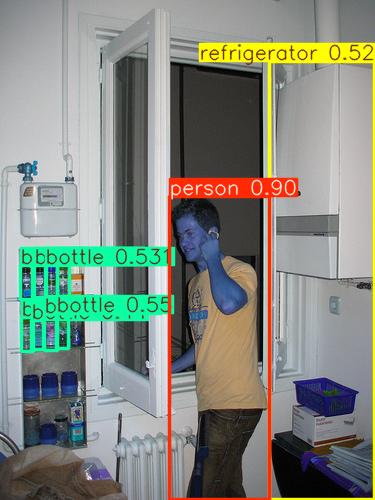

In [ ]:
from ultralytics import YOLO

# Load the pre-trained YOLOv8 model
model = YOLO('yolov8n.pt')  # 'yolov8n.pt' is a lightweight version for faster inference

# Test the model on a single image from the training set
test_image_path = f"{images_path}/{train_images[0]}"
results = model(test_image_path)

# Visualize the results
results[0].plot()



image 1/1 /content/VOC_dataset/VOCdevkit/VOC2012/JPEGImages/2011_007113.jpg: 640x480 1 person, 8 bottles, 1 refrigerator, 8.7ms
Speed: 3.0ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


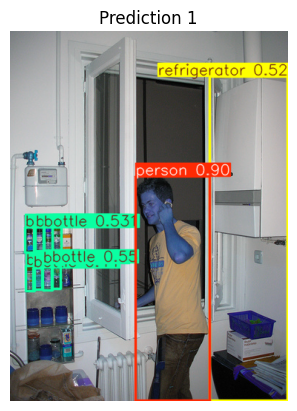


image 1/1 /content/VOC_dataset/VOCdevkit/VOC2012/JPEGImages/2011_003258.jpg: 480x640 2 persons, 1 bus, 1 truck, 1 handbag, 52.7ms
Speed: 2.8ms preprocess, 52.7ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


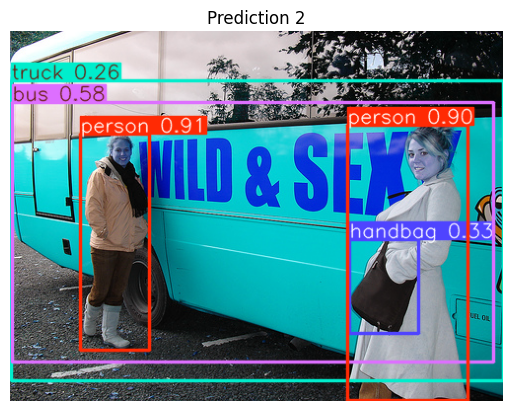


image 1/1 /content/VOC_dataset/VOCdevkit/VOC2012/JPEGImages/2007_004009.jpg: 480x640 1 airplane, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


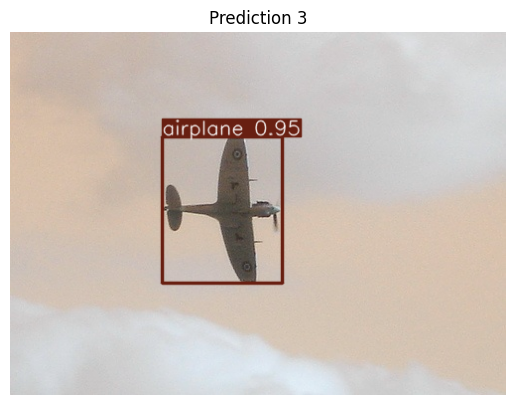


image 1/1 /content/VOC_dataset/VOCdevkit/VOC2012/JPEGImages/2012_002877.jpg: 480x640 1 person, 1 chair, 1 remote, 1 keyboard, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


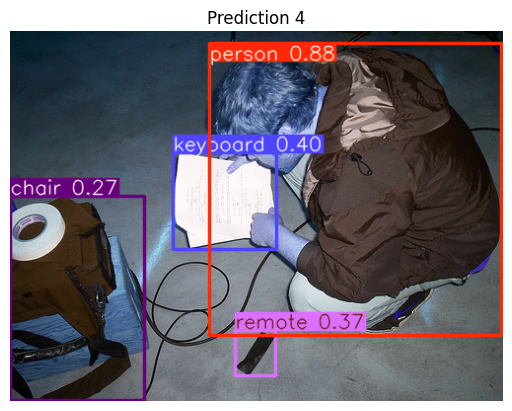


image 1/1 /content/VOC_dataset/VOCdevkit/VOC2012/JPEGImages/2012_003053.jpg: 480x640 2 persons, 1 teddy bear, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


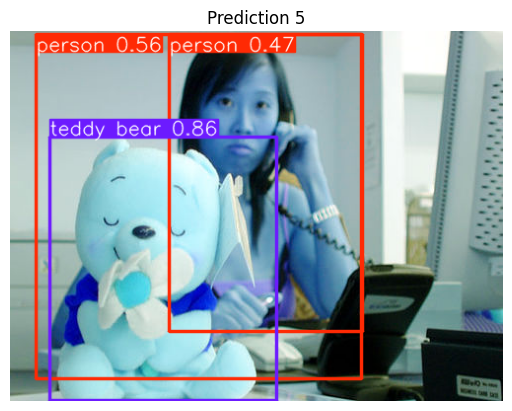

In [ ]:
import matplotlib.pyplot as plt

# Visualize predictions for 5 training images
for i, image_name in enumerate(train_images[:5]):
    image_path = f"{images_path}/{image_name}"
    results = model(image_path)
    plt.imshow(results[0].plot())
    plt.title(f"Prediction {i+1}")
    plt.axis('off')
    plt.show()


**9-Create YOLO Dataset Directories**

In [ ]:
import os
import shutil
from tqdm import tqdm
import xml.etree.ElementTree as ET

# Create directories for YOLO dataset
yolo_dataset_dir = "/content/yolo_dataset"
os.makedirs(f"{yolo_dataset_dir}/images/train", exist_ok=True)
os.makedirs(f"{yolo_dataset_dir}/images/val", exist_ok=True)
os.makedirs(f"{yolo_dataset_dir}/labels/train", exist_ok=True)
os.makedirs(f"{yolo_dataset_dir}/labels/val", exist_ok=True)

# Function to convert Pascal VOC to YOLO format
def convert_to_yolo(annotation_file, output_file, img_width, img_height):
    tree = ET.parse(annotation_file)
    root = tree.getroot()
    with open(output_file, "w") as f:
        for obj in root.findall("object"):
            class_name = obj.find("name").text
            if class_name in selected_classes:
                class_id = selected_classes.index(class_name)
                bbox = obj.find("bndbox")
                xmin = float(bbox.find("xmin").text)
                ymin = float(bbox.find("ymin").text)
                xmax = float(bbox.find("xmax").text)
                ymax = float(bbox.find("ymax").text)
                # Normalize coordinates
                x_center = ((xmin + xmax) / 2) / img_width
                y_center = ((ymin + ymax) / 2) / img_height
                width = (xmax - xmin) / img_width
                height = (ymax - ymin) / img_height
                # Write to file
                f.write(f"{class_id} {x_center} {y_center} {width} {height}\n")

# Process training and validation datasets
for split, images in [("train", train_images), ("val", val_images)]:
    for image_name in tqdm(images):
        img_file = f"{images_path}/{image_name}"
        annotation_file = f"{annotations_path}/{image_name.replace('.jpg', '.xml')}"
        img_output = f"{yolo_dataset_dir}/images/{split}/{image_name}"
        label_output = f"{yolo_dataset_dir}/labels/{split}/{image_name.replace('.jpg', '.txt')}"

        # Copy image to YOLO directory
        shutil.copy(img_file, img_output)

        # Convert annotation to YOLO format
        tree = ET.parse(annotation_file)
        root = tree.getroot()
        img_width = int(root.find("size/width").text)
        img_height = int(root.find("size/height").text)
        convert_to_yolo(annotation_file, label_output, img_width, img_height)

print("Dataset organized for YOLOv8!")


100%|██████████| 2844/2844 [00:01<00:00, 2024.93it/s]

Dataset organized for YOLOv8!


**10-Generate YOLO Dataset YAML File**

In [ ]:
# Create the data.yaml file for YOLOv8
data_yaml = """
train: /content/yolo_dataset/images/train
val: /content/yolo_dataset/images/val

nc: 10  # Number of classes
names: ['person', 'car', 'dog', 'cat', 'bicycle', 'aeroplane', 'train', 'bottle', 'bus', 'horse']
"""

# Write to file
with open('/content/yolo_dataset/data.yaml', 'w') as f:
    f.write(data_yaml)

print("data.yaml file created!")


data.yaml file created!


**YOLOv8 Training and Evaluatio**

**11-Fine-Tune YOLOv8 on Custom Dataset**

In [ ]:
# Train YOLOv8 on the custom dataset
model.train(
    data="/content/yolo_dataset/data.yaml",
    epochs=30,  # Set the number of epochs
    imgsz=640,  # Image size
    batch=16,   # Batch size
    name="custom_yolov8_model"  # Name for the trained model
)


Ultralytics 8.3.67 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yolo_dataset/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=custom_yolov8_model, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=

100%|██████████| 755k/755k [00:00<00:00, 91.0MB/s]


Overriding model.yaml nc=80 with nc=10

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 226MB/s]


AMP: checks passed ✅


train: Scanning /content/yolo_dataset/labels/train... 11372 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11372/11372 [00:07<00:00, 1478.72it/s]


train: New cache created: /content/yolo_dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/yolo_dataset/labels/val... 2844 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2844/2844 [00:02<00:00, 1331.21it/s]


val: New cache created: /content/yolo_dataset/labels/val.cache
Plotting labels to runs/detect/custom_yolov8_model/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/custom_yolov8_model
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.37G      1.786      2.665      1.878         56        640: 100%|██████████| 711/711 [01:10<00:00, 10.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:13<00:00,  6.54it/s]


                   all       2844       5488      0.537      0.471      0.465      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.37G      1.231       1.75      1.471         56        640: 100%|██████████| 711/711 [01:06<00:00, 10.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.13it/s]


                   all       2844       5488      0.595      0.528      0.554      0.374

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.31G      1.147       1.53      1.398         36        640: 100%|██████████| 711/711 [01:05<00:00, 10.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.19it/s]


                   all       2844       5488      0.634      0.556      0.596      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.26G      1.098      1.421      1.357         57        640: 100%|██████████| 711/711 [01:04<00:00, 11.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.10it/s]


                   all       2844       5488       0.64      0.559      0.607      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.27G      1.071      1.342      1.332         42        640: 100%|██████████| 711/711 [01:04<00:00, 11.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.21it/s]


                   all       2844       5488      0.679      0.558      0.626      0.445

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30       2.3G      1.038      1.294       1.31         39        640: 100%|██████████| 711/711 [01:04<00:00, 10.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.23it/s]


                   all       2844       5488        0.7      0.581      0.655      0.467

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.26G      1.021      1.253      1.298         41        640: 100%|██████████| 711/711 [01:04<00:00, 11.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.14it/s]


                   all       2844       5488      0.661      0.621      0.655      0.479

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.28G     0.9985       1.22      1.283         58        640: 100%|██████████| 711/711 [01:04<00:00, 11.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.36it/s]


                   all       2844       5488      0.709      0.598      0.657      0.477

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       2.3G     0.9835      1.196      1.269         33        640: 100%|██████████| 711/711 [01:04<00:00, 10.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.29it/s]


                   all       2844       5488      0.729       0.58      0.667      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.26G     0.9592      1.161      1.257         59        640: 100%|██████████| 711/711 [01:04<00:00, 11.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.33it/s]


                   all       2844       5488      0.728      0.622      0.681      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.28G     0.9559      1.139      1.251         33        640: 100%|██████████| 711/711 [01:04<00:00, 10.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.31it/s]


                   all       2844       5488      0.727      0.621      0.693      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.27G     0.9406      1.113      1.241         77        640: 100%|██████████| 711/711 [01:04<00:00, 11.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.26it/s]


                   all       2844       5488      0.724      0.629      0.696       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.27G     0.9359        1.1      1.236         52        640: 100%|██████████| 711/711 [01:04<00:00, 11.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.24it/s]


                   all       2844       5488      0.713      0.654      0.704      0.526

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.27G     0.9277      1.082      1.229         59        640: 100%|██████████| 711/711 [01:05<00:00, 10.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.31it/s]


                   all       2844       5488      0.719      0.645      0.705       0.53

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.27G     0.9165      1.076      1.224         42        640: 100%|██████████| 711/711 [01:04<00:00, 11.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.22it/s]


                   all       2844       5488      0.752      0.645      0.719      0.539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.27G     0.9098       1.05      1.222         44        640: 100%|██████████| 711/711 [01:04<00:00, 11.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.23it/s]


                   all       2844       5488       0.73      0.652       0.72      0.542

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.28G     0.9013      1.037      1.212         33        640: 100%|██████████| 711/711 [01:05<00:00, 10.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.26it/s]


                   all       2844       5488       0.73      0.656       0.72      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.26G     0.8953      1.026      1.205         41        640: 100%|██████████| 711/711 [01:04<00:00, 11.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.20it/s]


                   all       2844       5488      0.749       0.64      0.723      0.547

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.28G     0.8878      1.006      1.205         54        640: 100%|██████████| 711/711 [01:04<00:00, 11.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.39it/s]


                   all       2844       5488      0.751      0.649      0.716      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.28G     0.8755     0.9941      1.194         45        640: 100%|██████████| 711/711 [01:04<00:00, 10.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.35it/s]


                   all       2844       5488      0.746      0.661      0.729      0.556
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.26G     0.8376       0.88      1.165         36        640: 100%|██████████| 711/711 [01:04<00:00, 11.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.16it/s]


                   all       2844       5488      0.759      0.653      0.728      0.559

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.29G     0.8201     0.8424      1.151         18        640: 100%|██████████| 711/711 [01:03<00:00, 11.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.33it/s]


                   all       2844       5488      0.744      0.667      0.732      0.562

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.26G     0.8085     0.8233      1.145         26        640: 100%|██████████| 711/711 [01:03<00:00, 11.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.36it/s]


                   all       2844       5488       0.77      0.659      0.736      0.566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.26G     0.7951     0.8037      1.134         18        640: 100%|██████████| 711/711 [01:03<00:00, 11.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.29it/s]

                   all       2844       5488      0.772      0.662      0.742       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.26G      0.792     0.7927      1.128         24        640: 100%|██████████| 711/711 [01:03<00:00, 11.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.30it/s]

                   all       2844       5488       0.76      0.674      0.742      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.26G     0.7826     0.7767      1.123         25        640: 100%|██████████| 711/711 [01:03<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.32it/s]


                   all       2844       5488      0.753      0.671      0.746      0.579

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.25G      0.773     0.7616      1.115         20        640: 100%|██████████| 711/711 [01:03<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.36it/s]


                   all       2844       5488      0.764      0.668      0.744      0.579

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.28G     0.7633      0.744      1.108         31        640: 100%|██████████| 711/711 [01:03<00:00, 11.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.29it/s]

                   all       2844       5488      0.768       0.67      0.747      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.24G     0.7568     0.7377      1.104         21        640: 100%|██████████| 711/711 [01:03<00:00, 11.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.38it/s]

                   all       2844       5488      0.755      0.678      0.749      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.26G     0.7571     0.7263        1.1         18        640: 100%|██████████| 711/711 [01:03<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:10<00:00,  8.44it/s]

                   all       2844       5488      0.748      0.689      0.748      0.585



30 epochs completed in 0.636 hours.
Optimizer stripped from runs/detect/custom_yolov8_model/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/custom_yolov8_model/weights/best.pt, 6.2MB

Validating runs/detect/custom_yolov8_model/weights/best.pt...
Ultralytics 8.3.67 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:12<00:00,  7.25it/s]


                   all       2844       5488      0.748       0.69      0.748      0.584
                person       1901       3367      0.769      0.769      0.813      0.615
                   car        235        454      0.697      0.628      0.684      0.512
                   dog        282        336      0.787      0.801      0.855      0.679
                   cat        232        268      0.837      0.843      0.891      0.705
               bicycle        104        143      0.646      0.552      0.643      0.483
             aeroplane        161        211      0.882      0.744      0.828      0.643
                 train        106        131       0.84      0.762      0.834      0.661
                bottle        158        304      0.594      0.444      0.447      0.293
                   bus         88        134      0.822      0.739      0.813      0.695
                 horse         96        140      0.605      0.614      0.671      0.558
Speed: 0.1ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d15283e55d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.0

**12-Evaluate the fine-tuned model and calculate mAP**

In [ ]:
metrics = model.val(data="/content/yolo_dataset/data.yaml")
print(metrics)


Ultralytics 8.3.67 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/yolo_dataset/labels/val.cache... 2844 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2844/2844 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 178/178 [00:14<00:00, 12.62it/s]


                   all       2844       5488      0.747      0.688      0.748      0.584
                person       1901       3367      0.767      0.772      0.813      0.615
                   car        235        454      0.691      0.628      0.684      0.511
                   dog        282        336      0.787      0.804      0.855      0.676
                   cat        232        268      0.838      0.847      0.891      0.703
               bicycle        104        143      0.641      0.552      0.642      0.483
             aeroplane        161        211      0.892      0.741      0.828      0.642
                 train        106        131      0.845      0.756      0.833      0.659
                bottle        158        304      0.591      0.444      0.449      0.295
                   bus         88        134      0.825      0.731      0.811      0.691
                 horse         96        140      0.594      0.607      0.671      0.562
Speed: 0.1ms preproce

In [ ]:
import os
print(os.listdir("runs/detect/custom_yolov8_model/weights"))


['last.pt', 'best.pt']


In [ ]:
model = YOLO("runs/detect/custom_yolov8_model/weights/best.pt")


In [ ]:
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')


'en_US.UTF-8'

In [ ]:
test_image = "/content/test_image.jpg"


**13-Visualize YOLOv8 predictions for bounding boxes and segmentation masks.**

Saving horse.jpg to horse.jpg
Saving car.jpg to car.jpg
Saving cat.jpg to cat.jpg
Saving dog.jpg to dog.jpg
Saving f35.jpg to f35.jpg
Processing image: horse.jpg

image 1/1 /content/horse.jpg: 448x640 3 horses, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /content/output_horse.jpg


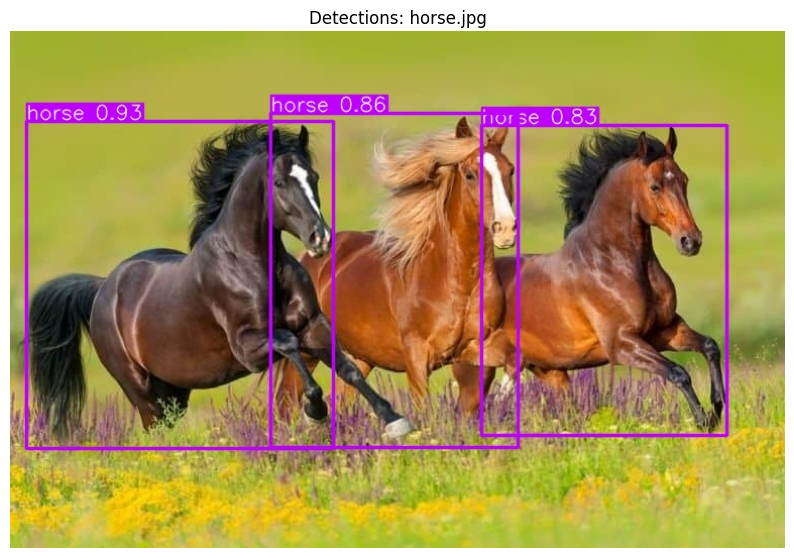

Processing image: car.jpg

image 1/1 /content/car.jpg: 480x640 1 car, 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to /content/output_car.jpg


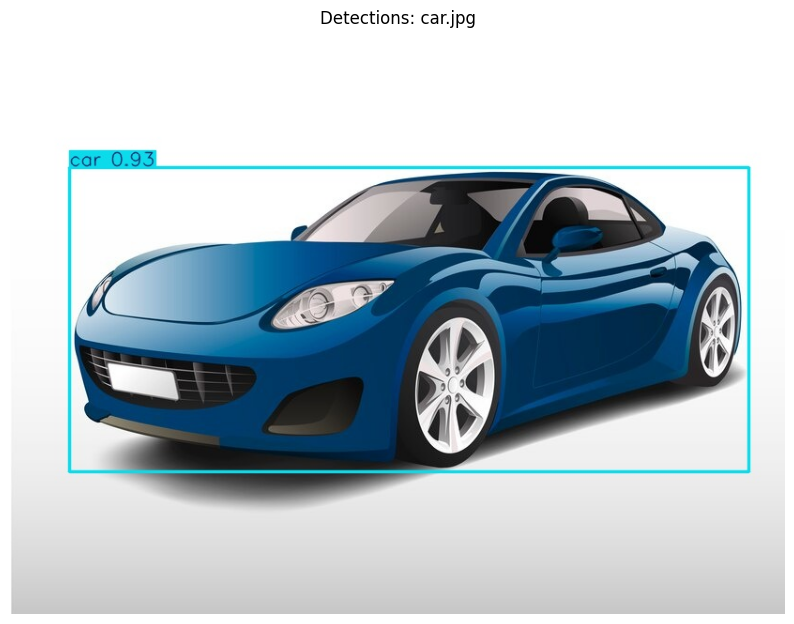

Processing image: cat.jpg

image 1/1 /content/cat.jpg: 448x640 1 cat, 8.4ms
Speed: 3.0ms preprocess, 8.4ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /content/output_cat.jpg


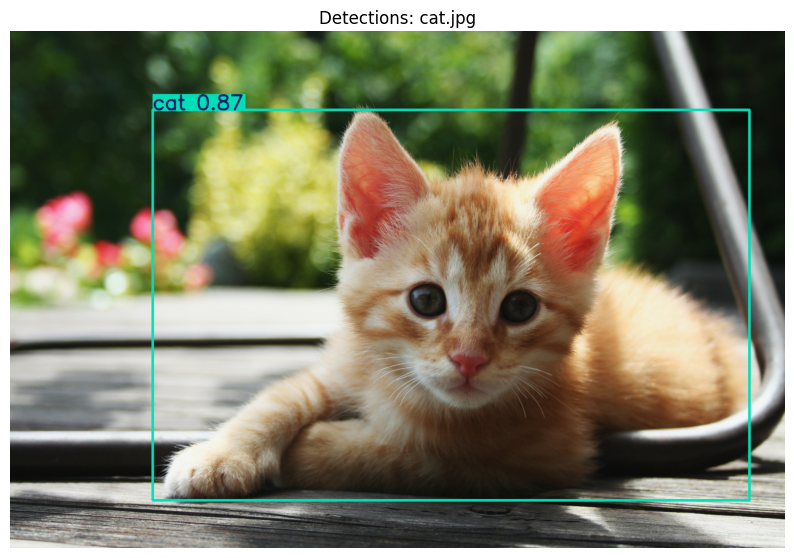

Processing image: dog.jpg

image 1/1 /content/dog.jpg: 448x640 1 dog, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /content/output_dog.jpg


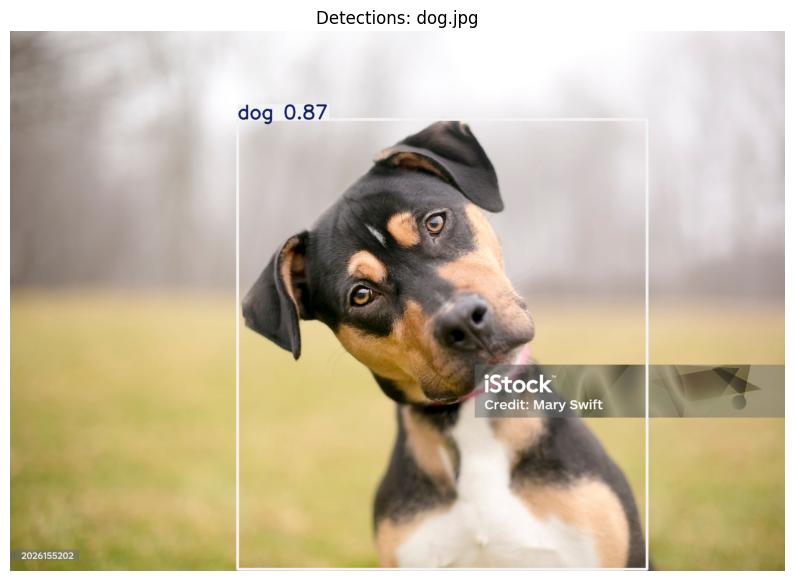

Processing image: f35.jpg

image 1/1 /content/f35.jpg: 448x640 1 aeroplane, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /content/output_f35.jpg


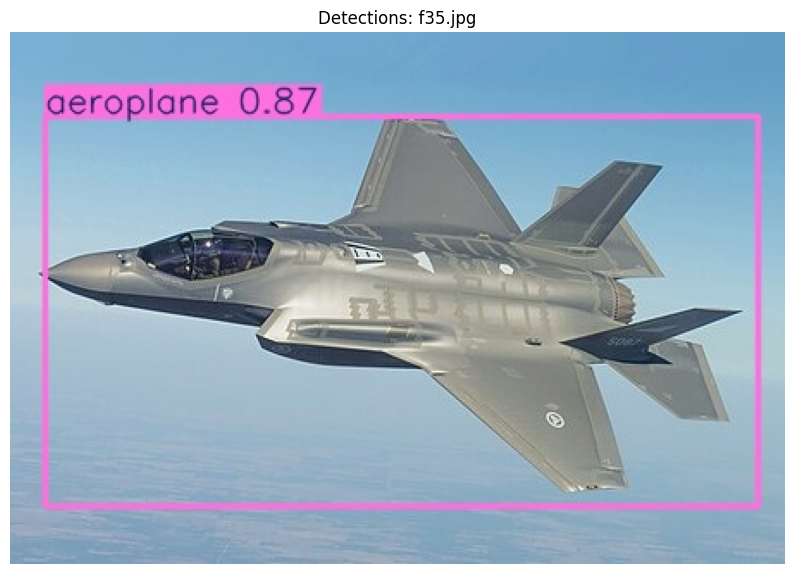

In [ ]:
from google.colab import files
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import os

# Upload multiple images and save their paths
uploaded = files.upload()  # Allows you to upload multiple images
image_paths = [f"/content/{filename}" for filename in uploaded.keys()]

# Load the trained YOLO model
model = YOLO("runs/detect/custom_yolov8_model/weights/best.pt")

# Process and visualize results for each uploaded image
for image_path in image_paths:
    print(f"Processing image: {os.path.basename(image_path)}")

    # Run YOLO model on the image
    results = model(image_path)

    # Plot the image with bounding boxes
    results[0].plot()

    # Save the output for visualization
    output_path = f"/content/output_{os.path.basename(image_path)}"
    cv2.imwrite(output_path, results[0].plot())  # Correctly save the visualized image

    print(f"Results saved to {output_path}")

    # Display the image with bounding boxes
    img_with_boxes = cv2.imread(output_path)
    if img_with_boxes is not None:
        img_with_boxes = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(10, 10))
        plt.imshow(img_with_boxes)
        plt.axis("off")
        plt.title(f"Detections: {os.path.basename(image_path)}")
        plt.show()
    else:
        print(f"Error: Could not read the saved image at {output_path}")


**YOLOv8 Segmentation Mask Visualization**


image 1/1 /content/cat.jpg: 448x640 1 cat, 8.0ms
Speed: 2.9ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)


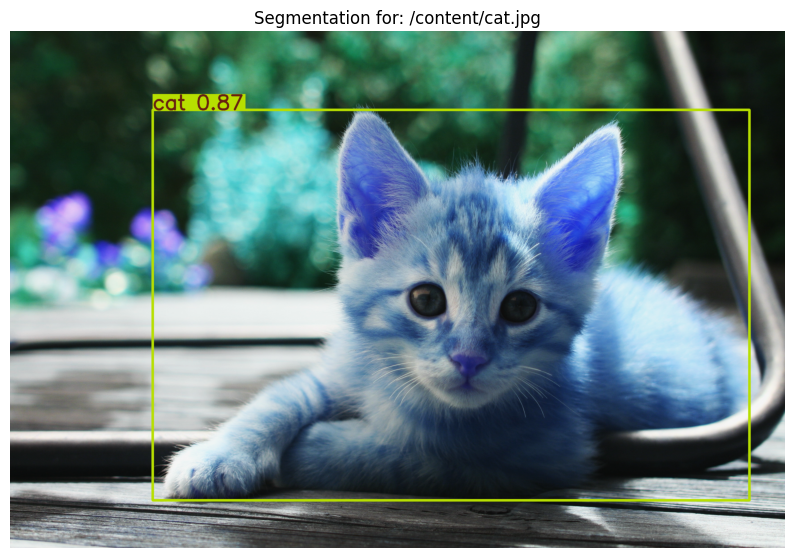


image 1/1 /content/dog.jpg: 448x640 1 dog, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


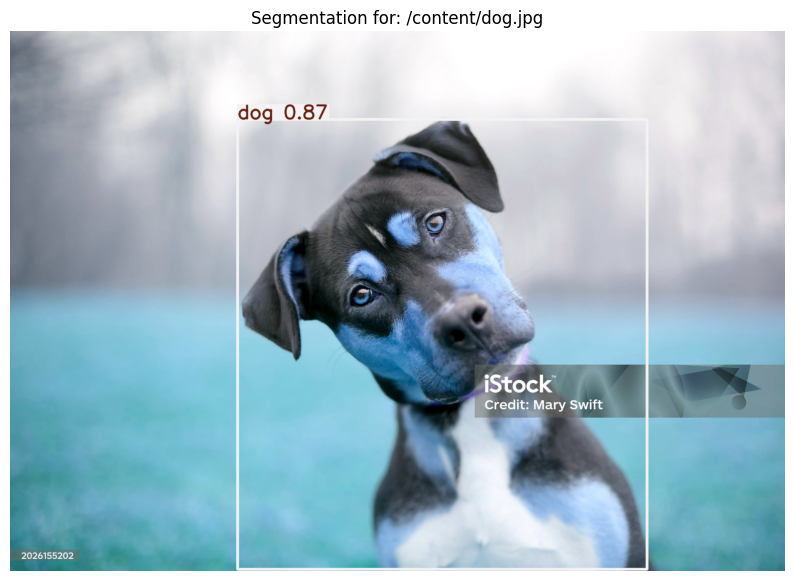


image 1/1 /content/f35.jpg: 448x640 1 aeroplane, 7.9ms
Speed: 2.1ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


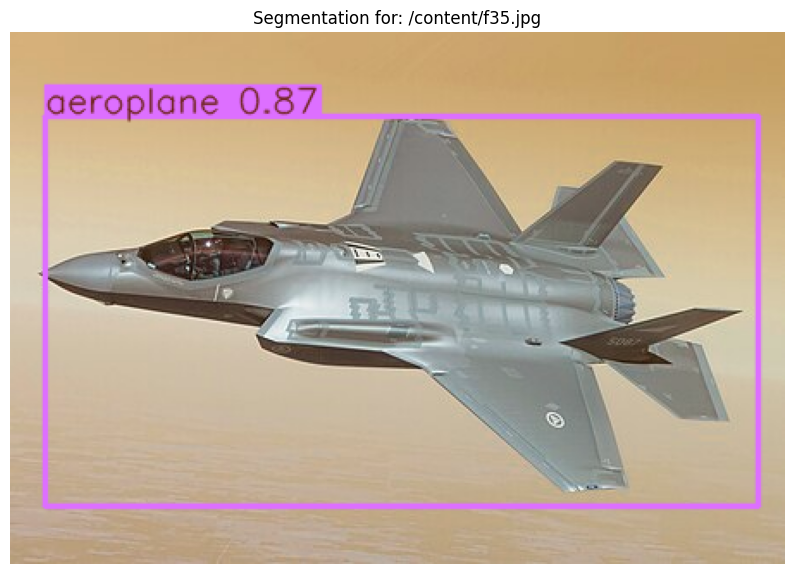

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Load the trained YOLOv8 model
model = YOLO("runs/detect/custom_yolov8_model/weights/best.pt")

# Define the image paths
test_images = [
    "/content/cat.jpg",
    "/content/dog.jpg",
    "/content/f35.jpg"
]

# Loop through test images and process segmentation masks
for image_path in test_images:
    # Run the model for segmentation
    results = model(image_path)

    # Extract the image with segmentation overlay
    segmented_image = results[0].plot()  # Segmentation visualization

    # Display the results
    plt.figure(figsize=(10, 10))
    plt.imshow(segmented_image)
    plt.axis("off")
    plt.title(f"Segmentation for: {image_path}")
    plt.show()


**U-Net Preprocessing**

**14-Resize Images and Masks for U-Net**

In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm

# Paths to images and masks
image_dir = "/content/VOC_dataset/VOCdevkit/VOC2012/JPEGImages"
mask_dir = "/content/VOC_dataset/VOCdevkit/VOC2012/SegmentationClass"
output_image_dir = "/content/segmentation_dataset/images"
output_mask_dir = "/content/segmentation_dataset/masks"

# Create output directories
os.makedirs(output_image_dir, exist_ok=True)
os.makedirs(output_mask_dir, exist_ok=True)

# Resize dimensions for U-Net
img_size = 256

# Prepare dataset
print("Processing images and masks...")
for image_name in tqdm(os.listdir(image_dir)):
    image_path = os.path.join(image_dir, image_name)
    mask_path = os.path.join(mask_dir, image_name.replace(".jpg", ".png"))

    # Check if the corresponding mask exists
    if not os.path.exists(mask_path):
        continue

    # Load and resize image
    image = cv2.imread(image_path)
    image = cv2.resize(image, (img_size, img_size))
    cv2.imwrite(os.path.join(output_image_dir, image_name), image)

    # Load and resize mask
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (img_size, img_size))
    cv2.imwrite(os.path.join(output_mask_dir, image_name.replace(".jpg", ".png")), mask)

print("Segmentation dataset prepared!")


Processing images and masks...


100%|██████████| 17125/17125 [00:13<00:00, 1264.74it/s]

Segmentation dataset prepared!


**15-Define U-Net Architecture**

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model

# Define Dice Loss
def dice_loss(y_true, y_pred):
    smooth = 1.0
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice = (2.0 * intersection + smooth) / (union + smooth)
    return 1 - dice

# Combined Loss
def combined_loss(y_true, y_pred):
    return tf.keras.losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

# Updated U-Net Model with Batch Normalization
def build_unet(input_shape=(256, 256, 3)):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = layers.BatchNormalization()(c1)
    c1 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    c1 = layers.BatchNormalization()(c1)
    p1 = layers.MaxPooling2D((2, 2))(c1)
    p1 = layers.Dropout(0.1)(p1)

    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = layers.BatchNormalization()(c2)
    c2 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    c2 = layers.BatchNormalization()(c2)
    p2 = layers.MaxPooling2D((2, 2))(c2)
    p2 = layers.Dropout(0.1)(p2)

    # Bottleneck
    b1 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    b1 = layers.BatchNormalization()(b1)
    b1 = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(b1)
    b1 = layers.BatchNormalization()(b1)

    # Decoder
    u1 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(b1)
    u1 = layers.concatenate([u1, c2])
    c3 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u1)
    c3 = layers.BatchNormalization()(c3)
    c3 = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c3)
    c3 = layers.BatchNormalization()(c3)

    u2 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c3)
    u2 = layers.concatenate([u2, c1])
    c4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u2)
    c4 = layers.BatchNormalization()(c4)
    c4 = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c4)
    c4 = layers.BatchNormalization()(c4)

    outputs = layers.Conv2D(1, (1, 1), activation='sigmoid')(c4)

    model = Model(inputs, outputs)
    return model

# Build and compile the U-Net model
unet_model = build_unet()
unet_model.compile(optimizer='adam', loss=combined_loss, metrics=['accuracy'])
unet_model.summary()


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_44 (Conv2D)        │ (None, 256, 256, 64)   │          1,792 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 64)   │            256 │ conv2d_44[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_45 (Conv2D)        │ (None, 256, 256, 64)   │         36,928 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 256, 256, 64)   │            256 │ conv2d_45[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_8           │ (None, 128, 128, 64)   │              0 │ batch_normalization_1… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 128, 128, 64)   │              0 │ max_pooling2d_8[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_46 (Conv2D)        │ (None, 128, 128, 128)  │         73,856 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 128, 128, 128)  │            512 │ conv2d_46[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_47 (Conv2D)        │ (None, 128, 128, 128)  │        147,584 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 128, 128, 128)  │            512 │ conv2d_47[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_9           │ (None, 64, 64, 128)    │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 64, 64, 128)    │              0 │ max_pooling2d_9[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_48 (Conv2D)        │ (None, 64, 64, 256)    │        295,168 │ dropout_3[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 64, 64, 256)    │          1,024 │ conv2d_48[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_49 (Conv2D)   

 Total params: 1,867,969 (7.13 MB)

 Trainable params: 1,865,409 (7.12 MB)

 Non-trainable params: 2,560 (10.00 KB)

**16-Train U-Net Model**

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import albumentations as A

# Data generator with Albumentations
class SegmentationDataGenerator(Sequence):
    def __init__(self, image_dir, mask_dir, batch_size, img_size):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.batch_size = batch_size
        self.img_size = img_size
        self.image_list = os.listdir(image_dir)

        # Define Albumentations augmentations
        self.augment = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            A.OneOf([
                A.MotionBlur(p=0.2),
                A.MedianBlur(blur_limit=3, p=0.2),
                A.GaussianBlur(p=0.2),
                A.GaussNoise(p=0.2)
            ], p=0.3),
            A.RandomBrightnessContrast(p=0.5),
            A.HueSaturationValue(p=0.3),
            A.Resize(img_size, img_size)
        ])

    def __len__(self):
        return len(self.image_list) // self.batch_size

    def __getitem__(self, idx):
        batch_images = self.image_list[idx * self.batch_size:(idx + 1) * self.batch_size]
        images = []
        masks = []

        for image_name in batch_images:
            image = cv2.imread(os.path.join(self.image_dir, image_name))
            mask = cv2.imread(os.path.join(self.mask_dir, image_name.replace(".jpg", ".png")), cv2.IMREAD_GRAYSCALE)

            # Apply augmentations
            augmented = self.augment(image=image, mask=mask)
            image = augmented['image'] / 255.0  # Normalize
            mask = augmented['mask'] / 255.0  # Normalize

            images.append(image)
            masks.append(mask[..., np.newaxis])  # Add channel dimension

        return np.array(images), np.array(masks)

# Split dataset into training and validation
train_gen = SegmentationDataGenerator(output_image_dir, output_mask_dir, batch_size=16, img_size=256)
val_gen = SegmentationDataGenerator(output_image_dir, output_mask_dir, batch_size=16, img_size=256)

# Callbacks
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6, verbose=1)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_unet_model.keras', monitor='val_loss', save_best_only=True, verbose=1)

# Train the U-Net
history = unet_model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,  # Increased epochs for better training
    callbacks=[lr_scheduler, early_stopping, model_checkpoint]
)


Epoch 1/30
182/182 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.5297 - loss: 1.3684
Epoch 1: val_loss improved from inf to 1.29470, saving model to best_unet_model.keras
182/182 ━━━━━━━━━━━━━━━━━━━━ 39s 138ms/step - accuracy: 0.5301 - loss: 1.3679 - val_accuracy: 0.6886 - val_loss: 1.2947 - learning_rate: 0.0010
Epoch 2/30
182/182 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6510 - loss: 1.1594
Epoch 2: val_loss improved from 1.29470 to 1.28809, saving model to best_unet_model.keras
182/182 ━━━━━━━━━━━━━━━━━━━━ 23s 127ms/step - accuracy: 0.6510 - loss: 1.1593 - val_accuracy: 0.6785 - val_loss: 1.2881 - learning_rate: 0.0010
Epoch 3/30
182/182 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6506 - loss: 1.1382
Epoch 3: val_loss improved from 1.28809 to 1.16071, saving model to best_unet_model.keras
182/182 ━━━━━━━━━━━━━━━━━━━━ 24s 128ms/step - accuracy: 0.6506 - loss: 1.1382 - val_accuracy: 0.6688 - val_loss: 1.1607 - learning_rate: 0.0010
Epoch 4/30
182/182 ━━━━━━━━━━━━━━━━━━━━ 0

**17-Validate U-Net Model**

In [ ]:
import matplotlib.pyplot as plt

def visualize_results(image_dir, mask_dir, model, img_size, num_samples=3):
    image_files = os.listdir(image_dir)
    plt.figure(figsize=(15, 5 * num_samples))

    for i in range(num_samples):
        # Select a random image
        image_name = random.choice(image_files)
        image_path = os.path.join(image_dir, image_name)
        mask_path = os.path.join(mask_dir, image_name.replace(".jpg", ".png"))

        # Read and preprocess the image
        image = cv2.imread(image_path)
        image_resized = cv2.resize(image, (img_size, img_size))
        image_normalized = image_resized / 255.0

        # Read the ground truth mask
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask_resized = cv2.resize(mask, (img_size, img_size))

        # Predict the mask
        prediction = model.predict(image_normalized[np.newaxis, ...])[0, ..., 0]
        predicted_mask = (prediction > 0.5).astype(np.uint8)  # Binarize the mask

        # Display the results
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.title("Input Image")
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis("off")

        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.title("Ground Truth Mask")
        plt.imshow(mask_resized, cmap="gray")
        plt.axis("off")

        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.title("Predicted Mask")
        plt.imshow(predicted_mask, cmap="gray")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


**18-Visualize U-Net Predictions**

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 716ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


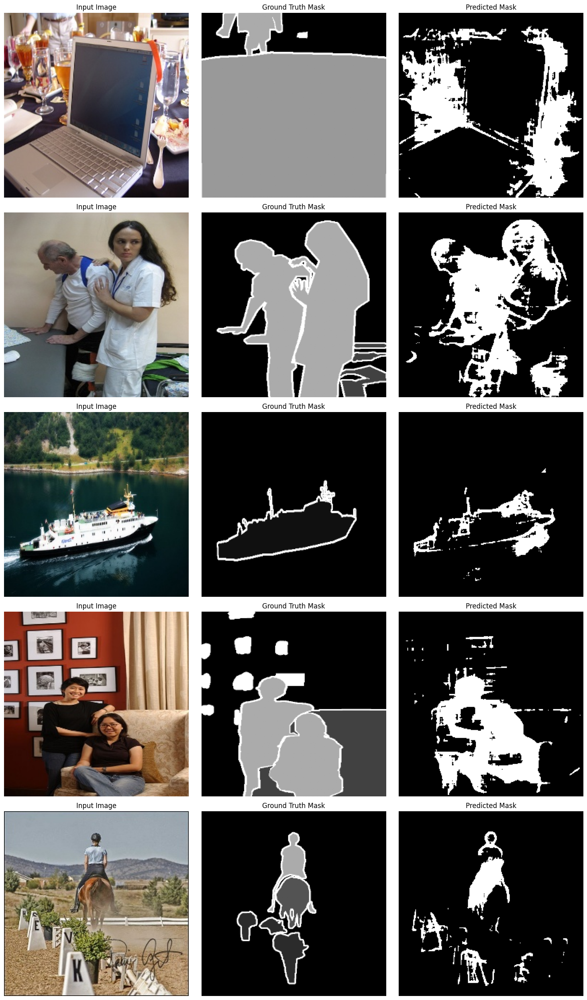

In [ ]:
# Visualize results on validation data
visualize_results(
    image_dir=output_image_dir,
    mask_dir=output_mask_dir,
    model=unet_model,
    img_size=256,
    num_samples=5  # Number of samples to visualize
)


**19-visualizing and saving results for U-Net:**

In [ ]:
import matplotlib.pyplot as plt
import random

def visualize_and_save_results(image_dir, mask_dir, model, img_size, save_dir, num_samples=5):
    os.makedirs(save_dir, exist_ok=True)  # Create directory for saving results
    image_files = os.listdir(image_dir)

    for i in range(num_samples):
        # Select a random image
        image_name = random.choice(image_files)
        image_path = os.path.join(image_dir, image_name)
        mask_path = os.path.join(mask_dir, image_name.replace(".jpg", ".png"))

        # Read and preprocess the image
        image = cv2.imread(image_path)
        image_resized = cv2.resize(image, (img_size, img_size))
        image_normalized = image_resized / 255.0

        # Read the ground truth mask
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask_resized = cv2.resize(mask, (img_size, img_size))

        # Predict the mask
        prediction = model.predict(image_normalized[np.newaxis, ...])[0, ..., 0]
        predicted_mask = (prediction > 0.5).astype(np.uint8)  # Binarize the mask

        # Plot and save results
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title("Input Image")
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.title("Ground Truth Mask")
        plt.imshow(mask_resized, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.title("Predicted Mask")
        plt.imshow(predicted_mask, cmap="gray")
        plt.axis("off")

        # Save figure
        save_path = os.path.join(save_dir, f"result_{i+1}.png")
        plt.savefig(save_path)
        plt.close()

# Save U-Net visualizations
visualize_and_save_results(
    image_dir=output_image_dir,
    mask_dir=output_mask_dir,
    model=unet_model,
    img_size=256,
    save_dir="/content/unet_results",
    num_samples=5
)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


**20-For YOLOv8 visualizations**

In [ ]:
from ultralytics import YOLO
import os

# Load YOLOv8 model
yolo_model = YOLO('yolov8n.pt')

# Visualize and save YOLOv8 results
def save_yolo_results(model, images, save_dir):
    os.makedirs(save_dir, exist_ok=True)
    for i, image_path in enumerate(images[:5]):  # Visualize 5 images
        results = model(image_path)
        # Save the plot manually
        save_path = os.path.join(save_dir, f"result_{i+1}.jpg")
        results[0].plot(show=False)
        plt.savefig(save_path)
        plt.close()

# Save YOLOv8 visualizations
image_paths = [os.path.join(output_image_dir, img) for img in os.listdir(output_image_dir)[:5]]
save_yolo_results(yolo_model, image_paths, "/content/yolo_results")



image 1/1 /content/segmentation_dataset/images/2008_002160.jpg: 640x640 1 bear, 7.9ms
Speed: 2.9ms preprocess, 7.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/segmentation_dataset/images/2007_003541.jpg: 640x640 2 persons, 1 remote, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/segmentation_dataset/images/2007_007203.jpg: 640x640 1 person, 1 dining table, 1 tv, 3 remotes, 1 keyboard, 4 books, 7.1ms
Speed: 2.6ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/segmentation_dataset/images/2011_001669.jpg: 640x640 1 car, 7.2ms
Speed: 2.4ms preprocess, 7.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/segmentation_dataset/images/2008_003362.jpg: 640x640 3 cars, 7.6ms
Speed: 2.4ms preprocess, 7.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


**21-Calculate mAP for YOLOv8**

In [ ]:
# Create a YAML file for the dataset
dataset_yaml_content = """
path: /content/yolo_dataset
train: images/train
val: images/val
names:
  0: class_1
  1: class_2
  2: class_3
  3: class_4
  4: class_5
  5: class_6
  6: class_7
  7: class_8
  8: class_9
  9: class_10
"""

# Write the YAML file
yaml_path = "/content/yolo_dataset/dataset.yaml"
os.makedirs("/content/yolo_dataset", exist_ok=True)
with open(yaml_path, "w") as f:
    f.write(dataset_yaml_content)


**22-Validate YOLOv8 model**

In [ ]:
# Validate YOLOv8 model
print("YOLOv8 Evaluation Metrics:")
results = yolo_model.val(data=yaml_path)  # Point to the YAML file
print(results)


YOLOv8 Evaluation Metrics:
Ultralytics 8.3.67 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)


val: Scanning /content/yolo_dataset/labels/val.cache... 2844 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2844/2844 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 178/178 [00:14<00:00, 12.50it/s]


                   all       2844       5488      0.156      0.156      0.163      0.126
                person       1901       3367      0.655      0.825      0.746      0.569
               bicycle        235        454    0.00585     0.0022    0.00136   0.000786
                   car        282        336          0          0    0.00128   0.000557
            motorcycle        232        268          0          0   0.000252   0.000167
              airplane        104        143          0          0   0.000966   0.000789
                   bus        161        211          0          0    0.00259    0.00192
                 train        106        131      0.897      0.733      0.873      0.683
                 truck        158        304          0          0   0.000751   0.000397
                  boat         88        134          0          0    0.00147    0.00118
         traffic light         96        140          0          0   9.05e-05   8.15e-05
Speed: 0.1ms preproce

**23-Calculate IoU for U-Net**

In [ ]:
import numpy as np
import cv2
from tqdm import tqdm

# Define IoU calculation function
def calculate_iou(y_true, y_pred):
    y_true = y_true.astype(bool)
    y_pred = y_pred.astype(bool)

    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    iou = intersection / union if union > 0 else 0.0
    return iou

# Evaluate IoU for U-Net on validation data
iou_scores = []

# Load images and masks for validation
for image_name in tqdm(os.listdir(output_image_dir)[:10]):  # Evaluate on 10 samples
    image_path = os.path.join(output_image_dir, image_name)
    mask_path = os.path.join(output_mask_dir, image_name.replace(".jpg", ".png"))

    # Load and preprocess image
    image = cv2.imread(image_path)
    image_resized = cv2.resize(image, (256, 256)) / 255.0

    # Load and preprocess ground truth mask
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask_resized = cv2.resize(mask, (256, 256))

    # Predict mask with U-Net
    prediction = unet_model.predict(image_resized[np.newaxis, ...])[0, ..., 0]
    predicted_mask = (prediction > 0.5).astype(np.uint8)  # Binarize predictions

    # Calculate IoU
    iou = calculate_iou(mask_resized, predicted_mask)
    iou_scores.append(iou)

# Calculate mean IoU
mean_iou = np.mean(iou_scores)
print(f"Mean IoU for U-Net: {mean_iou}")


  0%|          | 0/10 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 20%|██        | 2/10 [00:00<00:00, 15.59it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 40%|████      | 4/10 [00:00<00:00, 16.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


 60%|██████    | 6/10 [00:00<00:00, 16.31it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


 80%|████████  | 8/10 [00:00<00:00, 16.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


100%|██████████| 10/10 [00:00<00:00, 16.41it/s]

Mean IoU for U-Net: 0.34383949264585895


**24-Visualize YOLOv8 and U-Net Results**


image 1/1 /content/segmentation_dataset/images/2011_001536.jpg: 640x640 2 buss, 7.6ms
Speed: 3.1ms preprocess, 7.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step


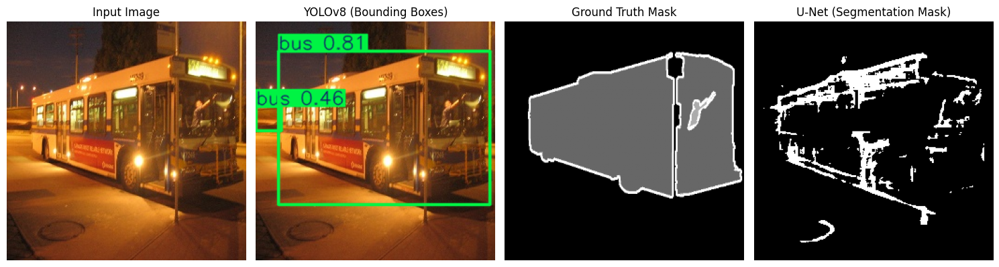


image 1/1 /content/segmentation_dataset/images/2010_004763.jpg: 640x640 (no detections), 9.3ms
Speed: 2.7ms preprocess, 9.3ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


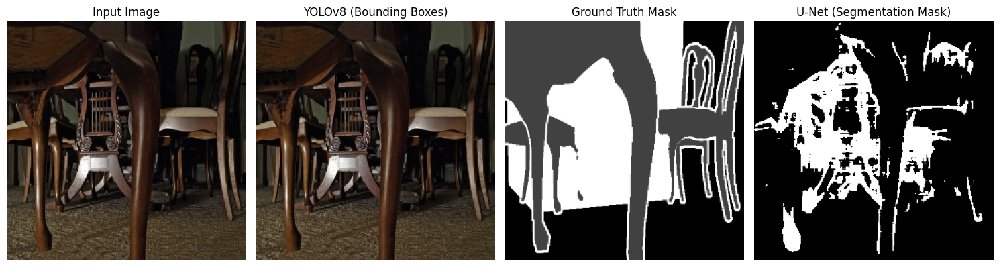


image 1/1 /content/segmentation_dataset/images/2007_000727.jpg: 640x640 4 persons, 1 car, 1 bus, 8.1ms
Speed: 2.8ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


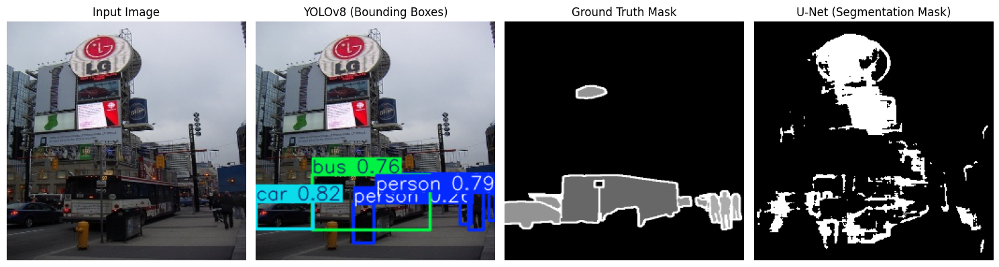


image 1/1 /content/segmentation_dataset/images/2007_002669.jpg: 640x640 (no detections), 7.9ms
Speed: 2.6ms preprocess, 7.9ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


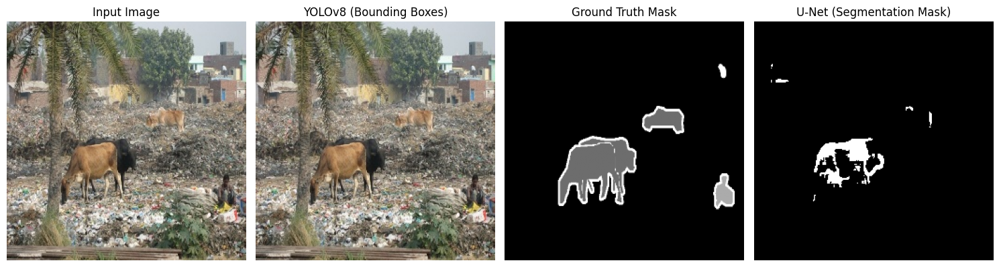


image 1/1 /content/segmentation_dataset/images/2008_007428.jpg: 640x640 (no detections), 8.5ms
Speed: 2.7ms preprocess, 8.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


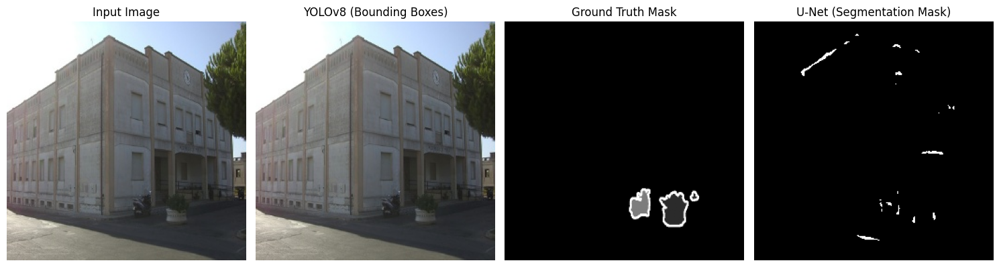

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
import random
from ultralytics import YOLO

# Define YOLOv8 and U-Net models
yolo_model = YOLO("runs/detect/custom_yolov8_model/weights/best.pt")
unet_model = tf.keras.models.load_model("best_unet_model.keras", compile=False)

# Visualization Function
def visualize_yolo_unet(image_dir, mask_dir, yolo_model, unet_model, img_size, num_samples=5):
    image_files = os.listdir(image_dir)
    for i in range(num_samples):
        # Select a random image
        image_name = random.choice(image_files)
        image_path = os.path.join(image_dir, image_name)
        mask_path = os.path.join(mask_dir, image_name.replace(".jpg", ".png"))

        # Read and preprocess the image
        image = cv2.imread(image_path)
        image_resized = cv2.resize(image, (img_size, img_size))
        image_normalized = image_resized / 255.0

        # Read the ground truth mask
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask_resized = cv2.resize(mask, (img_size, img_size))

        # YOLOv8 Prediction
        yolo_results = yolo_model(image_path)
        yolo_image = yolo_results[0].plot(show=False)  # Visualize bounding boxes

        # U-Net Prediction
        unet_prediction = unet_model.predict(image_normalized[np.newaxis, ...])[0, ..., 0]
        unet_mask = (unet_prediction > 0.5).astype(np.uint8)  # Binarize the mask

        # Plot results
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 4, 1)
        plt.title("Input Image")
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.axis("off")

        plt.subplot(1, 4, 2)
        plt.title("YOLOv8 (Bounding Boxes)")
        plt.imshow(cv2.cvtColor(yolo_image, cv2.COLOR_BGR2RGB))
        plt.axis("off")

        plt.subplot(1, 4, 3)
        plt.title("Ground Truth Mask")
        plt.imshow(mask_resized, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 4, 4)
        plt.title("U-Net (Segmentation Mask)")
        plt.imshow(unet_mask, cmap="gray")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

# Visualize YOLOv8 and U-Net Results
visualize_yolo_unet(
    image_dir=output_image_dir,
    mask_dir=output_mask_dir,
    yolo_model=yolo_model,
    unet_model=unet_model,
    img_size=256,
    num_samples=5  # Visualize 5 samples
)


**25- Dynamically Compare Results**

In [ ]:
import pandas as pd

# Dynamically retrieve results
yolo_results = yolo_model.val(data="/content/yolo_dataset/data.yaml")
yolo_map50 = yolo_results.box.map50  # mAP@50
yolo_map5095 = yolo_results.box.map  # mAP@50-95
unet_mean_iou = np.mean(iou_scores)  # IoU already calculated

# Create a comparison DataFrame
comparison_data = {
    "Metric": ["mAP@50", "mAP@50-95", "Mean IoU"],
    "YOLOv8": [yolo_map50, yolo_map5095, "N/A"],
    "U-Net": ["N/A", "N/A", unet_mean_iou],
}

comparison_df = pd.DataFrame(comparison_data)
print("Comparison Results:")
print(comparison_df)

# Save to CSV
comparison_df.to_csv("/content/comparison_results.csv", index=False)
print("Comparison results saved as 'comparison_results.csv'.")


Ultralytics 8.3.67 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)


val: Scanning /content/yolo_dataset/labels/val.cache... 2844 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2844/2844 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 178/178 [00:13<00:00, 13.00it/s]


                   all       2844       5488      0.747      0.688      0.748      0.584
                person       1901       3367      0.767      0.772      0.813      0.615
                   car        235        454      0.691      0.628      0.684      0.511
                   dog        282        336      0.787      0.804      0.855      0.676
                   cat        232        268      0.838      0.847      0.891      0.703
               bicycle        104        143      0.641      0.552      0.642      0.483
             aeroplane        161        211      0.892      0.741      0.828      0.642
                 train        106        131      0.845      0.756      0.833      0.659
                bottle        158        304      0.591      0.444      0.449      0.295
                   bus         88        134      0.825      0.731      0.811      0.691
                 horse         96        140      0.594      0.607      0.671      0.562
Speed: 0.1ms preproce

In [ ]:
import matplotlib.pyplot as plt

# Data for the comparison chart
models = ['YOLOv8', 'YOLOv8', 'U-Net', 'U-Net']
metrics = ['mAP@50', 'mAP@50-95', 'Mean IoU', '1 - MSE (scaled)']
values = [0.748, 0.584, 0.344, 0.3]  # 1 - MSE is illustrative

# Bar colors
colors = ['#1f77b4', '#1f77b4', '#ff7f0e', '#ff7f0e']

# Plotting
plt.figure(figsize=(10, 6))
bars = plt.bar(metrics, values, color=colors)
plt.title('YOLOv8 vs. U-Net Performance Comparison', fontsize=14)
plt.ylabel('Metric Value', fontsize=12)
plt.ylim(0, 1.0)

# Annotate each bar with value
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval + 0.02, f'{yval:.3f}', ha='center', va='bottom', fontsize=10)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


**SAVE THE WORK TO THE GOOGLE DRIVE**